# GET THE DATA

### GET DATA with correct class redistribution and one hote encoding

In [1]:
import sys, os
sys.path.insert(0, os.path.join("/Users/eagle/Documents/eagle-classification", "ChannelViT"))
from load_data import Load_Data
from utils import count_data_per_class, convert_labels_to_one_hot, count_data_per_multiclass
num_classes = 7
path_Duramat = "/Users/eagle/FFHS/eagle-bfe - data/Duramat_no_pool_labels.pkl"
# directory_path = os.path.dirname(current_dir)+"/eagle-labelling/features_pickle/"
data_loader =  Load_Data(path_Duramat)
data_Duramat = data_loader.get_data()
label_counts_duramat = count_data_per_class(data_Duramat)
count_data_per_multiclass(data_Duramat)
labels = [item[1] for item in data_Duramat]  # Extract the labels (tensors)
data_Duramat = convert_labels_to_one_hot(data_Duramat, num_classes=num_classes)

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


{0: 5877, 1: 3242, 2: 3662, 3: 2179}
{'good': 5877, 'crack': 3242, 'cross': 3662, 'dark': 2179}
{0: 5877, 1: 158, 2: 985, 3: 28, 4: 933, 5: 407, 6: 1744}
{'good': 5877, 'crack': 158, 'cross': 985, 'dark': 28, 'crack&cross': 933, 'crack&dark': 407, 'crack&cross&dark': 1744}


In [2]:
data_Duramat[0][0].shape

(250, 250)

In [3]:
import sys, os
sys.path.insert(0, os.path.join("/Users/eagle/Documents/eagle-classification", "ChannelViT"))
from load_data import just_transform
tensor_label_list_Duramat = just_transform(data_Duramat, channels=[0])
from sklearn.model_selection import train_test_split

# Build stratify labels (convert one-hot / multi-hot tensors to class index via argmax)
stratify_labels = []
for _, lbl in tensor_label_list_Duramat:
	# support torch tensors and numpy arrays / lists
	if hasattr(lbl, "argmax"):
		# torch tensor -> use .argmax().item()
		try:
			stratify_labels.append(int(lbl.argmax().item()))
		except Exception:
			stratify_labels.append(int(lbl.argmax()))
	else:
		import numpy as _np
		stratify_labels.append(int(_np.argmax(lbl)))

train_data, val_data = train_test_split(
	tensor_label_list_Duramat,
	test_size=0.3,
	random_state=42,
	stratify=stratify_labels
)

# lists don't have .shape -> show lengths instead
len(train_data), len(val_data)




Preprocessing images: 100%|██████████| 10132/10132 [00:04<00:00, 2173.91it/s]


(7092, 3040)

# GET MODEL

In [4]:
# ...existing code...
import sys
import argparse
import re
import os
import torch

def parse_args():
    parser = argparse.ArgumentParser(description="Train and evaluate the model.")
    parser.add_argument('--num_train_epochs', type=int, default=18, help='Number of training epochs.')
    parser.add_argument('--batch_size', type=int, default=13, help='Batch size for training and evaluation.')
    parser.add_argument('--retrain', type=str, default='retrain', choices=['retrain', 'resume', 'predict_only'], help='Choose training mode: retrain, resume, or predict_only.')
    parser.add_argument('--use_only_EL', action='store_true', default=False, help='Use only EL images.')
    parser.add_argument('--all_colors', action='store_true', default=True, help='Use all available channels.')
    parser.add_argument('--num_classes', type=int, default=7, help='Number of classes.')     
    parser.add_argument('--init_weights_name', type=str, default='imagenet_channelvit_small_p16_with_hcs_supervised', help='Name of the initial weights file.')

    # In a notebook, avoid parsing the outer IPython argv — use an empty list.
    if ('ipykernel' in sys.modules) or ('get_ipython' in globals()):
        args = parser.parse_args([])   # safe for notebook
    else:
        args = parser.parse_args()

    def extract_number_from_name(name):
        match = re.search(r'p(\d+)', name)
        if match:
            return int(match.group(1))
        else:
            raise ValueError("No number found in the name")

    args.patch_size = extract_number_from_name(args.init_weights_name)
    return args


def setup_config(args):
    config = {}
    # __file__ is not defined inside notebooks — fall back to cwd when needed
    try:
        base = os.path.dirname(os.path.dirname(os.path.abspath(__file__)))
    except NameError:
        base = os.getcwd()
    config['current_dir'] = base

    config['device'] = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
    config['output_model_folder'] = os.path.join(f'/Data/models/model_with_{args.init_weights_name}/epochs_{args.num_train_epochs}/')
    config['input_model_folder'] = os.path.join('/Data/models/')
    config['images_folder'] = os.path.join(config['current_dir'], 'Data/images/')
    config['path_Website'] = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage"

    config['name_flag'] = 'rgb' if args.all_colors else 'gray'
    if args.use_only_EL:
        config['channels'] = [0]
    else:
        config['channels'] = [0,1,2,3,4,5,6] if args.all_colors else [0,1,2]

    if args.init_weights_name == 'imagenet_channelvit_small_p16_with_hcs_supervised':
        config['max_channels'] = 3
    elif args.init_weights_name == 'so2sat_channelvit_small_p8_with_hcs_hard_split_supervised':
        config['max_channels'] = 18 
    elif args.init_weights_name == 'cpjump_cellpaint_bf_channelvit_small_p8_with_hcs_supervised':
        config['max_channels'] = 8 
    elif args.init_weights_name == 'camelyon_channelvit_small_p8_with_hcs_supervised':
        config['max_channels'] = 3 
    else:
        raise ValueError(f"Unknown init_weights_name: {args.init_weights_name}. Please set max_channels accordingly.")
    
    return config

args = parse_args()
config = setup_config(args)
print(config)
print(args)
# ...existing code...

{'current_dir': '/Users/eagle/Documents/eagle-classification', 'device': device(type='mps'), 'output_model_folder': '/Data/models/model_with_imagenet_channelvit_small_p16_with_hcs_supervised/epochs_18/', 'input_model_folder': '/Data/models/', 'images_folder': '/Users/eagle/Documents/eagle-classification/Data/images/', 'path_Website': '/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage', 'name_flag': 'rgb', 'channels': [0, 1, 2, 3, 4, 5, 6], 'max_channels': 3}
Namespace(num_train_epochs=18, batch_size=13, retrain='retrain', use_only_EL=False, all_colors=True, num_classes=7, init_weights_name='imagenet_channelvit_small_p16_with_hcs_supervised', patch_size=16)


In [5]:
import sys, os
sys.path.insert(0, os.path.join("/Users/eagle/Documents/eagle-classification", "ChannelViT"))
from load_data import PVDataset, get_train_transforms, get_val_transforms
val_transforms = get_val_transforms()



In [6]:
dataset_train_1channel = PVDataset(train_data, channels=[[0]] * len(train_data), scale=1, return_labels=True, transform=val_transforms)
dataset_val_1channel = PVDataset(val_data, channels=[[0]] * len(val_data), scale=1, return_labels=True, transform=val_transforms)
dataset_train_1channel[0]

{'images': tensor([[[-3.6943, -3.6943, -3.6943,  ..., -3.7174, -3.7174, -3.7174],
          [-3.6943, -3.6943, -3.6943,  ..., -3.7174, -3.6943, -3.6943],
          [-3.6943, -3.6943, -3.6943,  ..., -3.7174, -3.7174, -3.7174],
          ...,
          [-2.6332, -2.6332, -2.5871,  ..., -2.3795, -2.4025, -2.3333],
          [-2.7024, -2.6563, -2.6332,  ..., -2.3795, -2.3795, -2.3564],
          [-2.6332, -2.5640, -2.5871,  ..., -2.3333, -2.2872, -2.2872]]]),
 'labels': tensor([0., 1., 0., 0., 0., 0., 0.]),
 'channels': tensor([0])}

In [7]:
path_Infinity = "/Users/eagle/Documents//eagle-labelling/features_pickle/Infinity_all_no_pool_labels.pkl"
data_loader =  Load_Data(path_Infinity)
data_Infinity_int = data_loader.get_data()
data_loader.get_label_statistics()
label_counts_infinity = count_data_per_class(data_Infinity_int)
count_data_per_multiclass(data_Infinity_int)

data_Infinity = convert_labels_to_one_hot(data_Infinity_int, num_classes)
tensor_label_list_Infinity = just_transform(data_Infinity, channels=[0], name='infinity')

dataset_Infinity = PVDataset(tensor_label_list_Infinity, channels=[[0]] * len(tensor_label_list_Infinity), scale=1, return_labels=True, transform=val_transforms)
dataset_Infinity_Dur = PVDataset(tensor_label_list_Infinity+train_data, channels=[[0]] * len(tensor_label_list_Infinity+train_data), scale=1, return_labels=True, transform=val_transforms)


{0: 2112, 1: 39, 2: 156, 3: 21, 4: 15, 5: 11, 7: 306, 8: 58, 9: 4, 10: 3}
{'good': 2112, 'crack': 39, 'cross': 156, 'dark': 21, 'crack&cross': 15, 'crack&dark': 11, 'corrosion': 306, 'corrosion&cross': 58, 'corrosion&crack&cross': 4, 'corrosion&crack': 3}
{0: 2112, 1: 72, 2: 233, 3: 32, 7: 371}
{'good': 2112, 'crack': 72, 'cross': 233, 'dark': 32, 'corrosion': 371}
{0: 2112, 1: 39, 2: 156, 3: 21, 4: 15, 5: 11, 7: 306, 8: 58, 9: 4, 10: 3}
{'good': 2112, 'crack': 39, 'cross': 156, 'dark': 21, 'crack&cross': 15, 'crack&dark': 11, 'corrosion': 306, 'corrosion&cross': 58, 'corrosion&crack&cross': 4, 'corrosion&crack': 3}


Preprocessing images: 100%|██████████| 2725/2725 [00:01<00:00, 2593.96it/s]


# TRAIN

In [10]:
config['current_dir']+config['output_model_folder']

'/Users/eagle/Documents/eagle-classification/Data/models/model_with_imagenet_channelvit_small_p16_with_hcs_supervised/epochs_18/'

In [8]:
from ChannelViT.training_multi_one_input_type_stages import retrain_resume_or_load_pretrained
args.max_channels=3

trainer = retrain_resume_or_load_pretrained(
    args, 
    config['current_dir'], 
    config['input_model_folder'], 
    config['device'], 
    config['output_model_folder'], 
    concat_train=dataset_Infinity_Dur, 
    concat_val=dataset_train_1channel,
    channels=config['channels'], 
    name_flag=config['name_flag'] + 'Duramat'
)

Warning!!!
Samplev2 channel vit randomly sample channels for each batch.
It is only compatible with Supervised learning
Doesn't work with DINO or Linear Prob


/Users/eagle/Documents/eagle-classification/ChannelViT/training_multi_one_input_type_stages.py:161: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.228000,0.024472,0.948675,0.979146
2,0.170600,0.029156,0.947124,0.979777
3,0.148900,0.018807,0.962775,0.985325
4,0.062600,0.006370,0.987592,0.995213
5,0.050900,0.005091,0.989989,0.996093
6,0.018000,0.005987,0.989989,0.996403
7,0.037400,0.002476,0.994924,0.998133
8,0.010200,0.001462,0.997744,0.999140
9,0.000900,0.001489,0.997744,0.999094
10,0.022900,0.001798,0.997885,0.998951


/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


PredictionOutput(predictions=array([[-11.221448 ,  14.442769 , -11.1750765, ..., -10.929242 ,
        -12.645326 , -12.3798895],
       [-13.024666 ,  17.45752  ,  11.531923 , ..., -14.966156 ,
        -11.5833025, -11.248141 ],
       [-13.582013 ,  13.412209 , -14.191391 , ..., -12.090716 ,
        -11.003997 , -11.372401 ],
       ...,
       [-15.919519 , -14.291515 ,  14.197733 , ..., -14.924573 ,
        -14.427921 , -13.704676 ],
       [ 14.638536 , -15.070392 , -14.929388 , ..., -16.008677 ,
        -14.442394 , -14.880731 ],
       [ 13.520505 , -16.006744 , -13.8592005, ..., -15.909636 ,
        -13.9230585, -14.482098 ]], dtype=float32), label_ids=array([[0, 1, 0, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 1, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0]], dtype=int32), metrics={'test_accuracy': 0.9997179921037789, 'test_f1': 0.9998091380426745, 'test_loss': 0.00028918759198859334,

# PREDICT DURAMAT VAL

In [9]:
[config['channels']]

[[0, 1, 2, 3, 4, 5, 6]]

In [17]:
predictions = trainer_7channel.predict(dataset_val_1channel) 
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics


/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


{'test_accuracy': 0.9773026315789474,
 'test_f1': 0.9907978243167608,
 'test_loss': 0.019825240597128868,
 'test_runtime': 7.4273,
 'test_samples_per_second': 409.303,
 'test_steps_per_second': 40.93}

In [18]:
import numpy as np
label_names  =  {  0: 'good',
            1: 'crack',
            2: 'cross',
            3: 'dark',
            4: 'corrosion',
            5: 'discoloration',
            6: 'delamination',
        }
num_labels = 7
# Evaluation cell - uses existing variables: predictions, num_labels, label_names (dict)
from sklearn.metrics import (f1_score, precision_score, recall_score,
                             precision_recall_fscore_support, hamming_loss,
                             multilabel_confusion_matrix, accuracy_score, roc_auc_score)

# prepare predictions and ground truth
logits = predictions.predictions
if isinstance(logits, (tuple, list)):
    logits = logits[0]
probs = 1.0 / (1.0 + np.exp(-logits))
preds = (probs > 0.5).astype(int)
true = predictions.label_ids.astype(int)

# overall multi-label metrics
metrics = {
    "f1_micro": f1_score(true, preds, average="micro"),
    "f1_macro": f1_score(true, preds, average="macro"),
    "precision_micro": precision_score(true, preds, average="micro", zero_division=0),
    "recall_micro": recall_score(true, preds, average="micro", zero_division=0),
    "hamming_loss": hamming_loss(true, preds),
    "subset_accuracy": float(np.mean(np.all(true == preds, axis=1))),
}
print("Overall metrics:")
for k, v in metrics.items():
    print(f"  {k}: {v:.4f}")

# per-class precision/recall/f1/support
prec, rec, f1, sup = precision_recall_fscore_support(true, preds, average=None, zero_division=0)
print("\nPer-class metrics:")
for i in range(num_labels):
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  precision={prec[i]:.3f}  recall={rec[i]:.3f}  f1={f1[i]:.3f}  support={int(sup[i])}")

# per-class confusion components (TN, FP, FN, TP)
mlcm = multilabel_confusion_matrix(true, preds)
print("\nPer-class confusion (TN, FP, FN, TP):")
for i, cm in enumerate(mlcm):
    tn, fp, fn, tp = cm.ravel()
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  TN={tn:5d}  FP={fp:5d}  FN={fn:5d}  TP={tp:5d}")

# top-1 accuracy on examples that are single-label in ground truth
single_mask = (true.sum(axis=1) == 1)
if single_mask.any():
    true_single = true[single_mask].argmax(axis=1)
    pred_single = preds[single_mask].argmax(axis=1)
    top1_acc = accuracy_score(true_single, pred_single)
    print(f"\nTop-1 accuracy on single-label examples: {top1_acc:.4f}  (n={int(single_mask.sum())})")
else:
    print("\nNo single-label examples found for top-1 accuracy.")

# try ROC-AUC per class if applicable
try:
    aucs = []
    for i in range(num_labels):
        # require both positive and negative labels for AUC
        if len(np.unique(true[:, i])) > 1:
            aucs.append(roc_auc_score(true[:, i], probs[:, i]))
        else:
            aucs.append(np.nan)
    print("\nPer-class ROC AUC:")
    for i, a in enumerate(aucs):
        name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
        print(f"  [{i}] {name:12s}  AUC={a if np.isnan(a) else f'{a:.4f}'}")
except Exception as e:
    print("\nROC AUC skipped due to error:", e)

Overall metrics:
  f1_micro: 0.9910
  f1_macro: 0.5650
  precision_micro: 0.9951
  recall_micro: 0.9871
  hamming_loss: 0.0038
  subset_accuracy: 0.9770

Per-class metrics:
  [0] good          precision=0.997  recall=0.997  f1=0.997  support=1763
  [1] crack         precision=0.997  recall=0.992  f1=0.994  support=973
  [2] cross         precision=0.997  recall=0.977  f1=0.987  support=1109
  [3] dark          precision=0.984  recall=0.970  f1=0.977  support=637
  [4] corrosion     precision=0.000  recall=0.000  f1=0.000  support=0
  [5] discoloration  precision=0.000  recall=0.000  f1=0.000  support=0
  [6] delamination  precision=0.000  recall=0.000  f1=0.000  support=0

Per-class confusion (TN, FP, FN, TP):
  [0] good          TN= 1271  FP=    6  FN=    6  TP= 1757
  [1] crack         TN= 2064  FP=    3  FN=    8  TP=  965
  [2] cross         TN= 1928  FP=    3  FN=   25  TP= 1084
  [3] dark          TN= 2393  FP=   10  FN=   19  TP=  618
  [4] corrosion     TN= 3040  FP=    0  FN= 

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# LOAD TRAINING

In [8]:
dataset_train_1channel[0]

{'images': tensor([[[-3.6943, -3.6943, -3.6943,  ..., -3.7174, -3.7174, -3.7174],
          [-3.6943, -3.6943, -3.6943,  ..., -3.7174, -3.6943, -3.6943],
          [-3.6943, -3.6943, -3.6943,  ..., -3.7174, -3.7174, -3.7174],
          ...,
          [-2.6332, -2.6332, -2.5871,  ..., -2.3795, -2.4025, -2.3333],
          [-2.7024, -2.6563, -2.6332,  ..., -2.3795, -2.3795, -2.3564],
          [-2.6332, -2.5640, -2.5871,  ..., -2.3333, -2.2872, -2.2872]]]),
 'labels': tensor([0., 1., 0., 0., 0., 0., 0.]),
 'channels': tensor([0])}

In [9]:
from ChannelViT.training_multi_one_input_type_stages import retrain_resume_or_load_pretrained

args.retrain='predict_only'
args.max_channels=3

trainer_from_file = retrain_resume_or_load_pretrained(
    args, 
    config['current_dir'], 
    config['input_model_folder'], 
    config['device'], 
    config['output_model_folder'], 
    concat_train=dataset_train_1channel, 
    concat_val=dataset_val_1channel,
    channels=config['channels'], 
    name_flag=config['name_flag'] + 'Duramat'
)


Warning!!!
Samplev2 channel vit randomly sample channels for each batch.
It is only compatible with Supervised learning
Doesn't work with DINO or Linear Prob


/Users/eagle/Documents/eagle-classification/ChannelViT/training_multi_one_input_type_stages.py:161: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch

Found checkpoints, loading the latest one.
Trainer state restored from /Users/eagle/Documents/eagle-classification/Data/models/model_with_imagenet_channelvit_small_p16_with_hcs_supervised/epochs_18/checkpoint-2718


# Infinity

In [10]:
dataset_Infinity[0]['images'].shape

torch.Size([1, 224, 224])

In [11]:
predictions_inf = trainer_from_file.predict(dataset_Infinity)
predlabels_inf = predictions_inf.predictions.argmax(axis=-1)
predictions_inf.metrics


/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


{'test_model_preparation_time': 0.0018,
 'test_accuracy': 1.0,
 'test_f1': 1.0,
 'test_loss': 5.051026164437644e-06,
 'test_runtime': 6.1513,
 'test_samples_per_second': 442.993,
 'test_steps_per_second': 34.139}

In [12]:
num_labels=7
import numpy as np
label_names  =  {  0: 'good',
            1: 'crack',
            2: 'cross',
            3: 'dark',
            4: 'corrosion',
            5: 'discoloration',
            6: 'delamination',
        }

# Evaluation cell - uses existing variables: predictions, num_labels, label_names (dict)
from sklearn.metrics import (f1_score, precision_score, recall_score,
                             precision_recall_fscore_support, hamming_loss,
                             multilabel_confusion_matrix, accuracy_score, roc_auc_score)

# prepare predictions and ground truth
logits = predictions_inf.predictions
if isinstance(logits, (tuple, list)):
    logits = logits[0]
probs = 1.0 / (1.0 + np.exp(-logits))
preds = (probs > 0.5).astype(int)
true = predictions_inf.label_ids.astype(int)

# overall multi-label metrics
metrics = {
    "f1_micro": f1_score(true, preds, average="micro"),
    "f1_macro": f1_score(true, preds, average="macro"),
    "precision_micro": precision_score(true, preds, average="micro", zero_division=0),
    "recall_micro": recall_score(true, preds, average="micro", zero_division=0),
    "hamming_loss": hamming_loss(true, preds),
    "subset_accuracy": float(np.mean(np.all(true == preds, axis=1))),
}
print("Overall metrics:")
for k, v in metrics.items():
    print(f"  {k}: {v:.4f}")

# per-class precision/recall/f1/support
prec, rec, f1, sup = precision_recall_fscore_support(true, preds, average=None, zero_division=0)
print("\nPer-class metrics:")
for i in range(num_labels):
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  precision={prec[i]:.3f}  recall={rec[i]:.3f}  f1={f1[i]:.3f}  support={int(sup[i])}")

# per-class confusion components (TN, FP, FN, TP)
mlcm = multilabel_confusion_matrix(true, preds)
print("\nPer-class confusion (TN, FP, FN, TP):")
for i, cm in enumerate(mlcm):
    tn, fp, fn, tp = cm.ravel()
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  TN={tn:5d}  FP={fp:5d}  FN={fn:5d}  TP={tp:5d}")

# top-1 accuracy on examples that are single-label in ground truth
single_mask = (true.sum(axis=1) == 1)
if single_mask.any():
    true_single = true[single_mask].argmax(axis=1)
    pred_single = preds[single_mask].argmax(axis=1)
    top1_acc = accuracy_score(true_single, pred_single)
    print(f"\nTop-1 accuracy on single-label examples: {top1_acc:.4f}  (n={int(single_mask.sum())})")
else:
    print("\nNo single-label examples found for top-1 accuracy.")

# try ROC-AUC per class if applicable
try:
    aucs = []
    for i in range(num_labels):
        # require both positive and negative labels for AUC
        if len(np.unique(true[:, i])) > 1:
            aucs.append(roc_auc_score(true[:, i], probs[:, i]))
        else:
            aucs.append(np.nan)
    print("\nPer-class ROC AUC:")
    for i, a in enumerate(aucs):
        name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
        print(f"  [{i}] {name:12s}  AUC={a if np.isnan(a) else f'{a:.4f}'}")
except Exception as e:
    print("\nROC AUC skipped due to error:", e)


Overall metrics:
  f1_micro: 1.0000
  f1_macro: 0.7143
  precision_micro: 1.0000
  recall_micro: 1.0000
  hamming_loss: 0.0000
  subset_accuracy: 1.0000

Per-class metrics:
  [0] good          precision=1.000  recall=1.000  f1=1.000  support=2112
  [1] crack         precision=1.000  recall=1.000  f1=1.000  support=72
  [2] cross         precision=1.000  recall=1.000  f1=1.000  support=233
  [3] dark          precision=1.000  recall=1.000  f1=1.000  support=32
  [4] corrosion     precision=1.000  recall=1.000  f1=1.000  support=371
  [5] discoloration  precision=0.000  recall=0.000  f1=0.000  support=0
  [6] delamination  precision=0.000  recall=0.000  f1=0.000  support=0

Per-class confusion (TN, FP, FN, TP):
  [0] good          TN=  613  FP=    0  FN=    0  TP= 2112
  [1] crack         TN= 2653  FP=    0  FN=    0  TP=   72
  [2] cross         TN= 2492  FP=    0  FN=    0  TP=  233
  [3] dark          TN= 2693  FP=    0  FN=    0  TP=   32
  [4] corrosion     TN= 2354  FP=    0  FN=  

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# WEBSITE

In [8]:
# from ChannelViT.load_data import Load_Data_Handler, count_data_per_class_in_labels
# from ChannelViT.utils import calculate_per_channel_stats, just_transform_with_norm

# path_Website = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage"
# data_loader_2 = Load_Data_Handler(path_Website, args, classified_by=["Ebrar", "Ralf"]) #, '23-P09-C', '23-P09-D', '23-P09-E', 'C14-A', 'C14-C','C14-I'
# data_Website = data_loader_2.get_data()
# label_counts_Website = count_data_per_class_in_labels(data_loader_2.labels_as_integers)
# print(label_counts_Website)

# calculated_mean, calculated_std = calculate_per_channel_stats(data_Website)
# tensor_label_list_Website = just_transform_with_norm(data_Website,
#     calculated_mean=calculated_mean,
#     calculated_std=calculated_std
# )

In [9]:
import pickle
from ChannelViT.utils import calculate_per_channel_stats, just_transform_with_norm
import numpy as _np
filtered_data_path = os.path.join(config['images_folder'], "filtered_data.pkl")
if os.path.exists(filtered_data_path):
    with open(filtered_data_path, "rb") as f:
        filtered_data = pickle.load(f)
    print(f"Filtered data loaded from {filtered_data_path}")

calculated_mean, calculated_std = calculate_per_channel_stats(filtered_data['data_Website_filtered'] + filtered_data['data_Website_Ralf_filtered'])
tensor_label_list_Website = just_transform_with_norm(
    filtered_data['data_Website_filtered'] + filtered_data['data_Website_Ralf_filtered'],
    calculated_mean=calculated_mean,
    calculated_std=calculated_std
)


# replace original line with this: ensure labels are length-5 and remove all-zero labels
filtered = []
def _ensure_len(lbl, L=num_classes):
    # convert to numpy array
    if hasattr(lbl, "numpy"):
        arr = _np.asarray(lbl.numpy())
    else:
        arr = _np.asarray(lbl)
    # scalar label -> one-hot
    if arr.ndim == 0:
        out = _np.zeros(L, dtype=float)
        out[int(arr)] = 1.0
        return out
    # truncate or pad to length L
    if arr.size >= L:
        return arr[:L].astype(float)
    out = _np.zeros(L, dtype=float)
    out[:arr.size] = arr.astype(float)
    return out

filtered = []
removed = 0
for pv, lbl in tensor_label_list_Website:
    ens = _ensure_len(lbl)          # normalize to length `num_classes`
    if not _np.all(ens == 0):      # drop all-zero labels
        filtered.append((pv, ens))
    else:
        removed += 1
tensor_label_list_Website = filtered

print(f"Filtered tensor_label_list_Website -> {len(tensor_label_list_Website)} examples (removed {removed} all-zero labels)")
train_7channel_data, val_7channel_data = train_test_split(tensor_label_list_Website, test_size=0.3, random_state=42)
    

train_transforms = get_train_transforms()
val_transforms = get_val_transforms()

dataset_train_7channel = PVDataset(train_7channel_data, channels=[config['channels']] * len(train_7channel_data), scale=1, return_labels=True, transform=train_transforms)
dataset_val_7channel = PVDataset(val_7channel_data, channels=[config['channels']] * len(val_7channel_data), scale=1, return_labels=True, transform=val_transforms)
dataset_Website = PVDataset(tensor_label_list_Website, channels=[config['channels']] * len(tensor_label_list_Website), scale=1, return_labels=True, transform=val_transforms)


Filtered data loaded from /Users/eagle/Documents/eagle-classification/Data/images/filtered_data.pkl
Calculating per-channel statistics across the entire dataset...


Stacking images: 100%|██████████| 403/403 [00:05<00:00, 79.87it/s]


Calculated Mean per channel: tensor([0.4555, 0.1823, 0.1942, 0.2310, 0.1948, 0.1836, 0.2034])
Calculated Std per channel: tensor([0.1924, 0.2483, 0.2060, 0.2174, 0.1726, 0.1772, 0.1692])


Normalizing images: 100%|██████████| 403/403 [00:02<00:00, 173.68it/s]

Filtered tensor_label_list_Website -> 403 examples (removed 0 all-zero labels)



/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


In [10]:
dataset_Website[0]['images'].shape

torch.Size([7, 224, 224])

In [ ]:
from ChannelViT.training_multi_one_input_type_stages import retrain_resume_or_load_pretrained_second_stage
print("\n----------------- STAGE 2: FINE-TUNING ON 7-CHANNEL DATA -----------------")
args.retrain = 'retrain'
args.batch_size = 10
trainer_7channel = retrain_resume_or_load_pretrained_second_stage(
    args, 
    config['current_dir'], 
    config['input_model_folder'], 
    config['device'], 
    config['output_model_folder'],
    concat_train=dataset_train_7channel, 
    concat_val=dataset_val_7channel,

)


----------------- STAGE 2: FINE-TUNING ON 7-CHANNEL DATA -----------------
Warning!!!
Samplev2 channel vit randomly sample channels for each batch.
It is only compatible with Supervised learning
Doesn't work with DINO or Linear Prob
Loading pretrained weights from /Users/eagle/Documents/eagle-classification/Data/models/model_with_imagenet_channelvit_small_p16_with_hcs_supervised/epochs_18/trained_state_dict.pth and adapting channel embeddings...
Adapting channel_embed: pretrained 3 -> model 7
Loaded pretrained weights (non-strict). Missing keys: []
Unexpected keys in state_dict: []

--- Initializing Phase A: Warm-up (Head & Channel Embeddings Trainable) ---
Total parameters: 21.47M
Trainable parameters (Head + Channel Embeddings): 0.01M


/Users/eagle/Documents/eagle-classification/ChannelViT/training_multi_one_input_type_stages.py:182: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(pretrain

Epoch,Training Loss,Validation Loss,Accuracy,F1
0,No log,1.259710,0.123967,0.209875
1,6.653600,1.254860,0.132231,0.218786
2,6.653600,1.251308,0.148760,0.227281
3,6.747200,1.249609,0.148760,0.227281
4,6.747200,1.249285,0.148760,0.227281


PredictionOutput(predictions=array([[-6.13085222e+00,  1.26037389e-01, -1.00551233e+01,
        -4.50751114e+00, -6.54214001e+00, -1.48646746e+01,
        -1.33856077e+01],
       [-1.06403112e+01, -1.40930152e+00,  6.13504767e-01,
        -2.30746150e+00, -5.27787733e+00, -1.22617149e+01,
        -1.04504442e+01],
       [-1.47115698e+01,  9.11740494e+00,  4.72741053e-02,
         5.40481043e+00, -9.22748852e+00, -1.33469477e+01,
        -1.40880108e+01],
       [-3.98081803e+00, -4.48524332e+00, -7.17388058e+00,
        -1.03014526e+01, -2.82772803e+00, -1.10075006e+01,
        -1.14930172e+01],
       [-5.01150131e+00, -5.88637877e+00, -5.00223064e+00,
        -8.06038857e+00, -3.88941598e+00, -1.39674568e+01,
        -1.17964697e+01],
       [-8.10954571e+00, -1.43026382e-01, -7.21147060e+00,
        -3.01003146e+00, -5.17224693e+00, -1.48761978e+01,
        -1.29449730e+01],
       [-1.33572721e+01,  9.23597431e+00,  4.44992065e+00,
        -6.39772177e-01, -7.06552315e+00, -1.375

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1
0,No log,1.042908,0.206612,0.303403
1,5.624500,0.557925,0.305785,0.403609
2,5.624500,0.450981,0.231405,0.484372
3,3.041100,0.402354,0.438017,0.495709
4,3.041100,0.366174,0.438017,0.619199
5,2.027500,0.296519,0.512397,0.612343
6,2.027500,0.294065,0.479339,0.621891
7,1.653200,0.256360,0.578512,0.648105
8,1.653200,0.260136,0.586777,0.662962
9,1.360100,0.283628,0.479339,0.638491


In [ ]:
dataset_Website[0]['labels']



array([0., 0., 0., 1., 0., 0., 0.])

In [ ]:
dataset_Website[0]['images'].shape
dataset_Website[0]['labels'].shape


(7,)

In [ ]:


predictions_web =trainer_7channel.predict(dataset_val_7channel)
predlabels_web = predictions_web.predictions.argmax(axis=-1)
predictions_web.metrics

{'test_accuracy': 0.7355371900826446,
 'test_f1': 0.8397748832145191,
 'test_loss': 0.1633649617433548,
 'test_runtime': 0.4764,
 'test_samples_per_second': 254.006,
 'test_steps_per_second': 27.29}

In [ ]:
[config['channels']]

[[0, 1, 2, 3, 4, 5, 6]]

In [ ]:
num_labels=7
import numpy as np
label_names  =  {  0: 'good',
            1: 'crack',
            2: 'cross',
            3: 'dark',
            4: 'corrosion',
            5: 'discoloration',
            6: 'delamination',
        }

# Evaluation cell - uses existing variables: predictions, num_labels, label_names (dict)
from sklearn.metrics import (f1_score, precision_score, recall_score,
                             precision_recall_fscore_support, hamming_loss,
                             multilabel_confusion_matrix, accuracy_score, roc_auc_score)

# prepare predictions and ground truth
logits = predictions_web.predictions
if isinstance(logits, (tuple, list)):
    logits = logits[0]
probs = 1.0 / (1.0 + np.exp(-logits))
preds = (probs > 0.5).astype(int)
true = predictions_web.label_ids.astype(int)

# overall multi-label metrics
metrics = {
    "f1_micro": f1_score(true, preds, average="micro"),
    "f1_macro": f1_score(true, preds, average="macro"),
    "precision_micro": precision_score(true, preds, average="micro", zero_division=0),
    "recall_micro": recall_score(true, preds, average="micro", zero_division=0),
    "hamming_loss": hamming_loss(true, preds),
    "subset_accuracy": float(np.mean(np.all(true == preds, axis=1))),
}
print("Overall metrics:")
for k, v in metrics.items():
    print(f"  {k}: {v:.4f}")

# per-class precision/recall/f1/support
prec, rec, f1, sup = precision_recall_fscore_support(true, preds, average=None, zero_division=0)
print("\nPer-class metrics:")
for i in range(num_labels):
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  precision={prec[i]:.3f}  recall={rec[i]:.3f}  f1={f1[i]:.3f}  support={int(sup[i])}")

# per-class confusion components (TN, FP, FN, TP)
mlcm = multilabel_confusion_matrix(true, preds)
print("\nPer-class confusion (TN, FP, FN, TP):")
for i, cm in enumerate(mlcm):
    tn, fp, fn, tp = cm.ravel()
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  TN={tn:5d}  FP={fp:5d}  FN={fn:5d}  TP={tp:5d}")

# top-1 accuracy on examples that are single-label in ground truth
single_mask = (true.sum(axis=1) == 1)
if single_mask.any():
    true_single = true[single_mask].argmax(axis=1)
    pred_single = preds[single_mask].argmax(axis=1)
    top1_acc = accuracy_score(true_single, pred_single)
    print(f"\nTop-1 accuracy on single-label examples: {top1_acc:.4f}  (n={int(single_mask.sum())})")
else:
    print("\nNo single-label examples found for top-1 accuracy.")

# try ROC-AUC per class if applicable
try:
    aucs = []
    for i in range(num_labels):
        # require both positive and negative labels for AUC
        if len(np.unique(true[:, i])) > 1:
            aucs.append(roc_auc_score(true[:, i], probs[:, i]))
        else:
            aucs.append(np.nan)
    print("\nPer-class ROC AUC:")
    for i, a in enumerate(aucs):
        name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
        print(f"  [{i}] {name:12s}  AUC={a if np.isnan(a) else f'{a:.4f}'}")
except Exception as e:
    print("\nROC AUC skipped due to error:", e)


Overall metrics:
  f1_micro: 0.8269
  f1_macro: 0.7709
  precision_micro: 0.8540
  recall_micro: 0.8014
  hamming_loss: 0.0579
  subset_accuracy: 0.6942

Per-class metrics:
  [0] good          precision=0.824  recall=0.583  f1=0.683  support=24
  [1] crack         precision=0.870  recall=0.909  f1=0.889  support=22
  [2] cross         precision=0.688  recall=0.786  f1=0.733  support=14
  [3] dark          precision=0.979  recall=0.868  f1=0.920  support=53
  [4] corrosion     precision=0.667  recall=0.500  f1=0.571  support=4
  [5] discoloration  precision=0.759  recall=0.846  f1=0.800  support=26
  [6] delamination  precision=1.000  recall=0.667  f1=0.800  support=3

Per-class confusion (TN, FP, FN, TP):
  [0] good          TN=   94  FP=    3  FN=   10  TP=   14
  [1] crack         TN=   96  FP=    3  FN=    2  TP=   20
  [2] cross         TN=  102  FP=    5  FN=    3  TP=   11
  [3] dark          TN=   67  FP=    1  FN=    7  TP=   46
  [4] corrosion     TN=  116  FP=    1  FN=    2 

In [ ]:
# ...existing code...
def pv_to_display(pv, extractor=None):
    """Convert pixel_values (torch/numpy, possibly normalized) -> HWC uint8 image for plt.imshow."""
    import numpy as np

    # convert torch tensor -> numpy
    if hasattr(pv, "numpy"):
        arr = pv.numpy()
    else:
        arr = np.asarray(pv)

    # handle batched (1, C, H, W)
    if arr.ndim == 4 and arr.shape[0] == 1:
        arr = arr[0]

    # channel-first (C, H, W) -> H, W, C
    if arr.ndim == 3 and arr.shape[0] in (1, 3):
        arr = np.transpose(arr, (1, 2, 0))

    # If already uint8, just clip and return
    if arr.dtype == np.uint8:
        out = np.clip(arr, 0, 255)
        # ensure HWC shape
        if out.ndim == 2:
            out = np.stack([out] * 3, axis=-1)
        elif out.ndim == 3 and out.shape[2] == 1:
            out = np.concatenate([out] * 3, axis=2)
        return out

    # try to undo extractor normalization if available
    try:
        if extractor is not None and hasattr(extractor, "image_mean") and hasattr(extractor, "image_std"):
            mean = np.array(extractor.image_mean).reshape(1, 1, -1)
            std = np.array(extractor.image_std).reshape(1, 1, -1)
            # if input is channel-first originally, above transpose handled it
            # only apply when channel counts match or when std/mean are scalar
            if mean.shape[-1] == arr.shape[-1] or mean.size == 1:
                arr = arr * std + mean
    except Exception:
        pass

    # ensure numeric array
    arr = np.nan_to_num(arr, nan=0.0, posinf=0.0, neginf=0.0)

    # compute statistics safely
    try:
        amax = float(np.nanmax(arr))
        amin = float(np.nanmin(arr))
    except Exception:
        amax, amin = 0.0, 0.0

    # common cases: values in [0,1] -> scale by 255
    if amax <= 1.1 and amin >= -0.1:
        arr = (arr - (0.0 if amin >= 0 else amin))
        arr = arr * 255.0
    else:
        # otherwise linearly rescale to 0-255
        if amax > amin:
            arr = (arr - amin) / (amax - amin) * 255.0
        else:
            arr = np.zeros_like(arr)

    # convert grayscale 2D or single-channel 3D to 3-channel
    if arr.ndim == 2:
        arr = np.stack([arr] * 3, axis=-1)
    elif arr.ndim == 3 and arr.shape[2] == 1:
        arr = np.concatenate([arr] * 3, axis=2)

    # final clip and uint8 cast
    arr = np.clip(arr, 0, 255).astype(np.uint8)
    return arr
# ...existing code...

In [37]:
len(dataset_Website)

295

295
[   0    1    2 ... 2707 2708 2709]
2053


IndexError: list index out of range

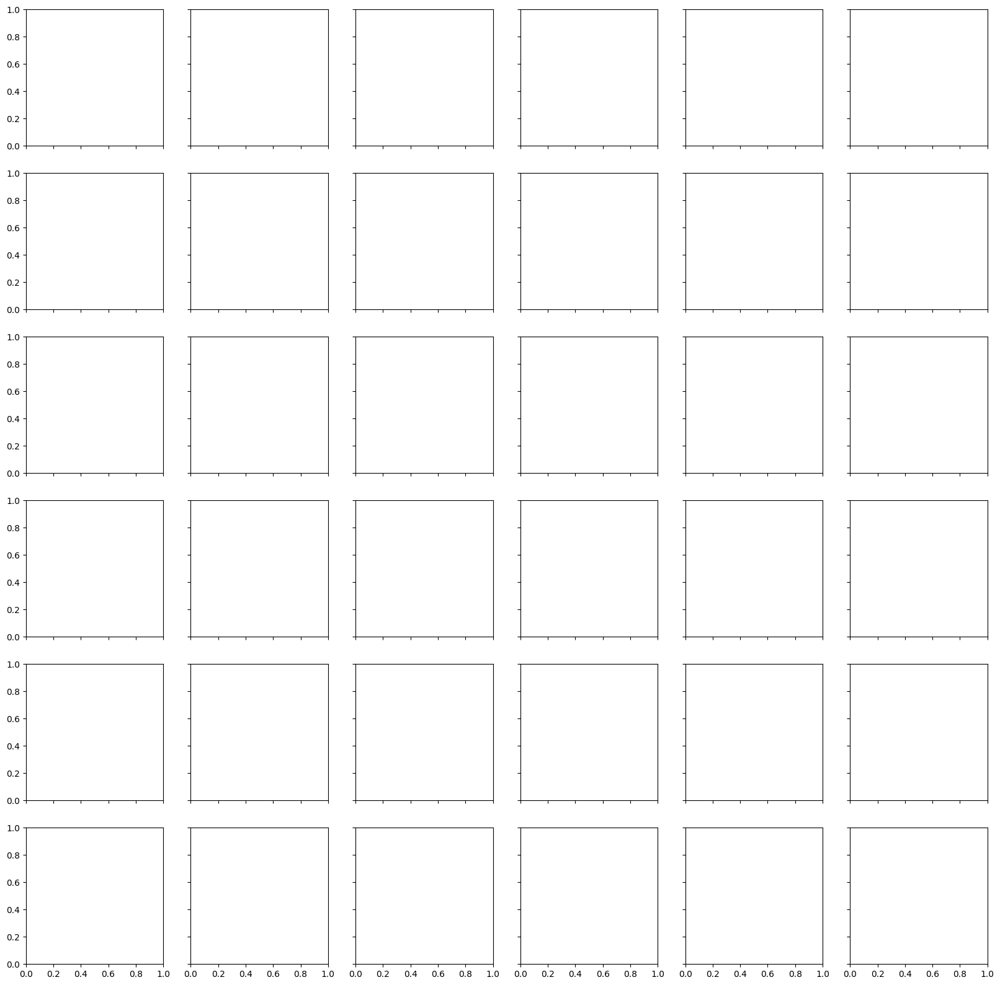

In [35]:
dataset_Website =tensor_label_list_Website
print(len(tensor_label_list_Website))

# ...existing code...
import numpy as np
import matplotlib.pyplot as plt

def vec_to_names(vec, label_names):
    """Convert a 1D one-hot/multi-hot vector (or tensor/list) -> list of label names."""
    arr = np.asarray(vec)
    if arr.ndim > 1:
        arr = arr.ravel()
    inds = np.where(arr.astype(int) == 1)[0]
    return [label_names.get(int(i), str(i)) for i in inds] if len(inds) else []

# Inspect samples predicted as this class index (change as needed)
target_class = 0

# ensure preds in numpy form
preds_arr = np.asarray(predlabels_web)

# select indices where target_class is predicted:
if preds_arr.ndim == 1:
    # single-label predictions (ints)
    class_idx = np.where(preds_arr == target_class)[0]
else:
    # multi-label predictions (multi-hot rows)
    class_idx = np.where(preds_arr[:, target_class] == 1)[0]
print(class_idx)
n_display = min(36, len(class_idx))

if n_display == 0:
    print(f"No predicted samples for class {target_class}")
else:
    sel = np.random.choice(class_idx, size=n_display, replace=False)
    fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
    axes = axes.flatten()
    for ax, idx in zip(axes, sel):
        print(int(idx))
        s = dataset_Website[int(idx)]
        pv = s.get('pixel_values', s.get('image'))  # support different keys
        img = pv_to_display(pv)

        # true label(s)
        true_vec = s['labels']
        try:
            true_names = vec_to_names(true_vec, label_names)
        except Exception:
            # fallback if labels are scalar ints
            true_names = [label_names.get(int(true_vec), str(int(true_vec)))] if not np.isscalar(true_vec) else [str(true_vec)]

        # predicted label(s)
        pred_item = preds_arr[int(idx)]
        if np.asarray(pred_item).ndim == 0:
            pred_names = [label_names.get(int(pred_item), str(int(pred_item)))]
        else:
            pred_names = vec_to_names(pred_item, label_names)

        true_str = ",".join(true_names) if true_names else "none"
        pred_str = ",".join(pred_names) if pred_names else "none"

        ax.imshow(img)
        ax.set_title(f"G: {true_str}\nP: {pred_str}", fontsize=9)
        ax.axis('off')

    for ax in axes[n_display:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
# ...existing code...
# filepath: /Users/eagle/Documents/eagle-classification/ViT_mulit_label.ipynb
# ...existing code...
import numpy as np
import matplotlib.pyplot as plt

def vec_to_names(vec, label_names):
    """Convert a 1D one-hot/multi-hot vector (or tensor/list) -> list of label names."""
    arr = np.asarray(vec)
    if arr.ndim > 1:
        arr = arr.ravel()
    inds = np.where(arr.astype(int) == 1)[0]
    return [label_names.get(int(i), str(i)) for i in inds] if len(inds) else []

# Inspect samples predicted as this class index (change as needed)
target_class = 1

# ensure preds in numpy form
preds_arr = np.asarray(predlabels_web)

# select indices where target_class is predicted:
if preds_arr.ndim == 1:
    # single-label predictions (ints)
    class_idx = np.where(preds_arr == target_class)[0]
else:
    # multi-label predictions (multi-hot rows)
    class_idx = np.where(preds_arr[:, target_class] == 1)[0]

n_display = min(36, len(class_idx))

if n_display == 0:
    print(f"No predicted samples for class {target_class}")
else:
    sel = np.random.choice(class_idx, size=n_display, replace=False)
    fig, axes = plt.subplots(6, 1, sharex=True, sharey=True, figsize=(20,20))
    axes = axes.flatten()
    for ax, idx in zip(axes, sel):
        s = dataset_Website[int(idx)]
        pv = s.get('pixel_values', s.get('image'))  # support different keys
        img = pv_to_display(pv)

        # true label(s)
        true_vec = s['labels']
        try:
            true_names = vec_to_names(true_vec, label_names)
        except Exception:
            # fallback if labels are scalar ints
            true_names = [label_names.get(int(true_vec), str(int(true_vec)))] if not np.isscalar(true_vec) else [str(true_vec)]

        # predicted label(s)
        pred_item = preds_arr[int(idx)]
        if np.asarray(pred_item).ndim == 0:
            pred_names = [label_names.get(int(pred_item), str(int(pred_item)))]
        else:
            pred_names = vec_to_names(pred_item, label_names)

        true_str = ",".join(true_names) if true_names else "none"
        pred_str = ",".join(pred_names) if pred_names else "none"

        ax.imshow(img)
        ax.set_title(f"G: {true_str}\nP: {pred_str}", fontsize=9)
        ax.axis('off')

    for ax in axes[n_display:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
# ...existing code...

In [76]:
label_names  =  {  0: 'good',
            1: 'crack',
            2: 'cross',
            3: 'dark',
            4: 'corrosion',
            5: 'discoloration',
            6: 'delamination',
        }

In [ ]:
from ChannelViT.utils import logits_to_classes, convert_list_of_arrays_to_labels, label_names
pred_labels, prob = logits_to_classes(predictions_web, initial_threshold=0.5)
predlabels = convert_list_of_arrays_to_labels(pred_labels)

current_dir = '/Users/eagle/Documents/eagle-classification/'

images_folder = os.path.join(current_dir, 'Data/images/')

empty_indices = [i for i, x in enumerate(predlabels) if not x]
print(f"Number of samples with no predicted labels: {len(empty_indices)}")
predlabels = [x for i, x in enumerate(predlabels) if i not in empty_indices]
pred_labels = [x for i, x in enumerate(pred_labels) if i not in empty_indices]
# Create a new dataset without the empty prediction samples for accurate metric calculation
dataset_filtered = [item for i, item in enumerate(dataset_Website) if i not in empty_indices]
true_labels = np.array([item['labels'] for item in dataset_filtered])

class_names = label_names()
from ChannelViT.plots import plot_multilabel_confusion_matrix
plot_multilabel_confusion_matrix(true_labels, pred_labels, class_names, output_path=os.path.join(images_folder, f'Infinity_confusion_matrix_ViT.png'))


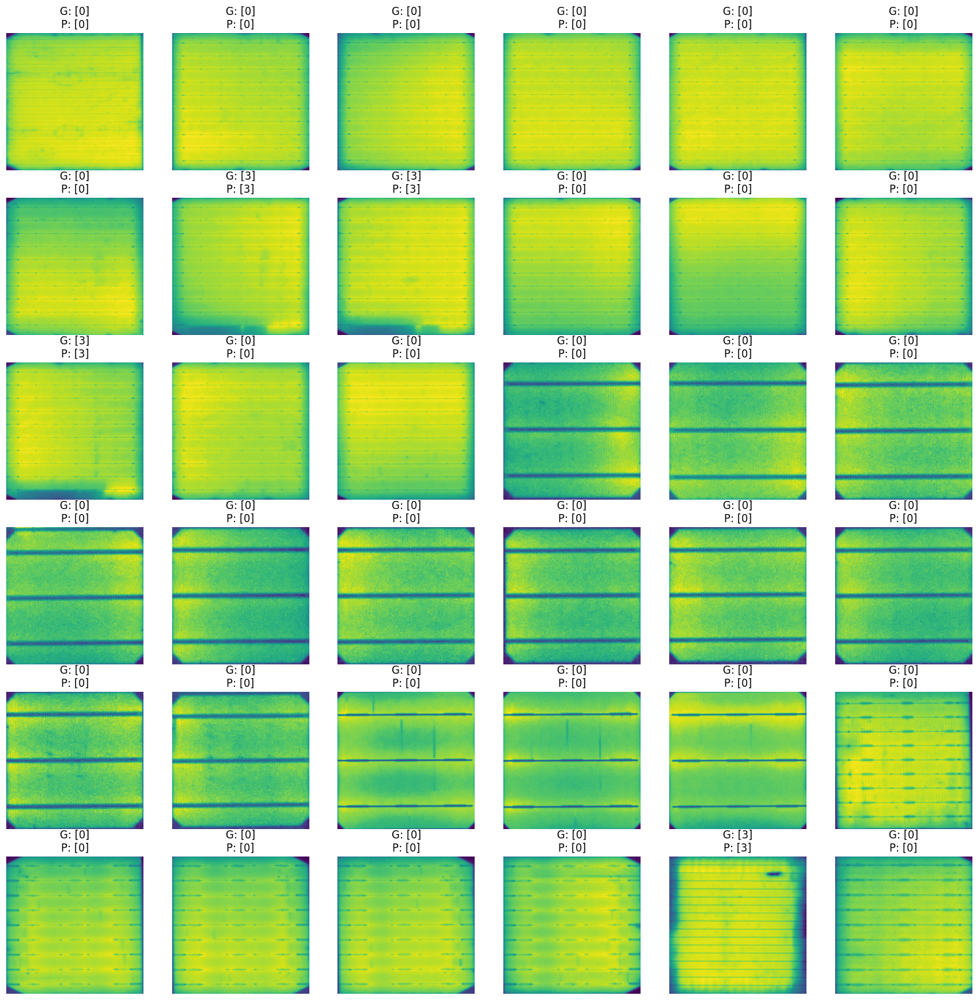

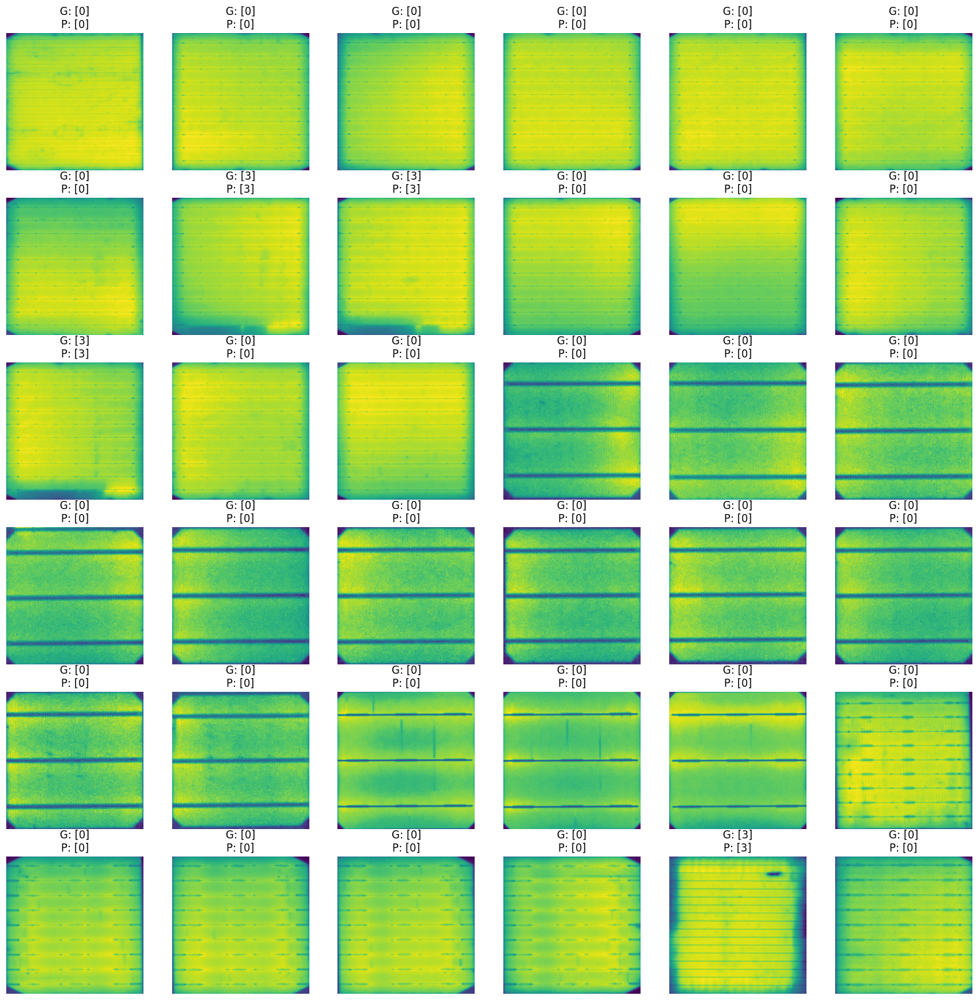

In [84]:
# ...existing code...
# plot correct samples (handles multi-labels and uses predictions_web which has 'pixel_values'+'labels')
import numpy as np
from matplotlib import pyplot as plt

# Build true label array and a binary prediction array so shapes match before comparison.
true = np.array([item['labels'] for item in dataset_Website])  # shape (N, num_labels)

# Build binary prediction matrix (N, num_labels) from predlabels (supports list-of-lists, numpy array of ints, or array-of-arrays)
if isinstance(predlabels, np.ndarray) and predlabels.ndim == 1 and predlabels.shape[0] == true.shape[0]:
    # single-label integer predictions
    pred_bin = np.zeros_like(true, dtype=int)
    pred_bin[np.arange(len(predlabels)), predlabels] = 1
else:
    pred_bin = np.zeros_like(true, dtype=int)
    for i, p in enumerate(predlabels):
        if p is None:
            continue
        if np.isscalar(p):
            pred_bin[i, int(p)] = 1
        else:
            for cls in p:
                pred_bin[i, int(cls)] = 1

# correct indices where all labels match
correct_idx = np.where(np.all(true == pred_bin, axis=1))[0]

if correct_idx.size == 0:
    print("No correct predictions found.")
else:
    fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
    cnt = 0
    for i in range(6):
        for j in range(6):
            if cnt >= len(correct_idx):
                ax[i, j].axis('off')
                continue
            idx0 = int(correct_idx[cnt])
            s = dataset_Website[idx0]
            pv = s['images']
            # convert tensor-like to numpy if needed and transpose for imshow
            try:
                if hasattr(pv, "numpy"):
                    pv = pv.numpy()
                img = np.transpose(pv, (1, 2, 0))
            except Exception:
                img = pv
            gt = np.where(true[idx0] > 0)[0].tolist()
            pred = predlabels[idx0]
            ax[i, j].imshow(img)
            ax[i, j].set_title(f"G: {gt}\nP: {pred}")
            ax[i, j].axis('off')
            cnt += 1
    plt.show()
# ...existing code...
# filepath: /Users/eagle/Documents/eagle-classification/ViT_mulit_label.ipynb
# ...existing code...
# plot correct samples (handles multi-labels and uses ds_test_inf which has 'pixel_values'+'labels')
import numpy as np
from matplotlib import pyplot as plt

# Build true label array and a binary prediction array so shapes match before comparison.
true = np.array([item['labels'] for item in dataset_Website])  # shape (N, num_labels)

# Build binary prediction matrix (N, num_labels) from predlabels (supports list-of-lists, numpy array of ints, or array-of-arrays)
if isinstance(predlabels, np.ndarray) and predlabels.ndim == 1 and predlabels.shape[0] == true.shape[0]:
    # single-label integer predictions
    pred_bin = np.zeros_like(true, dtype=int)
    pred_bin[np.arange(len(predlabels)), predlabels] = 1
else:
    pred_bin = np.zeros_like(true, dtype=int)
    for i, p in enumerate(predlabels):
        if p is None:
            continue
        if np.isscalar(p):
            pred_bin[i, int(p)] = 1
        else:
            for cls in p:
                pred_bin[i, int(cls)] = 1

# correct indices where all labels match
correct_idx = np.where(np.all(true == pred_bin, axis=1))[0]

if correct_idx.size == 0:
    print("No correct predictions found.")
else:
    fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
    cnt = 0
    for i in range(6):
        for j in range(6):
            if cnt >= len(correct_idx):
                ax[i, j].axis('off')
                continue
            idx0 = int(correct_idx[cnt])
            s = dataset_Website[idx0]
            pv = s['images']
            # convert tensor-like to numpy if needed and transpose for imshow
            try:
                if hasattr(pv, "numpy"):
                    pv = pv.numpy()
                img = np.transpose(pv, (1, 2, 0))
            except Exception:
                img = pv
            gt = np.where(true[idx0] > 0)[0].tolist()
            pred = predlabels[idx0]
            ax[i, j].imshow(img)
            ax[i, j].set_title(f"G: {gt}\nP: {pred}")
            ax[i, j].axis('off')
            cnt += 1
    plt.show()
# ...existing code...

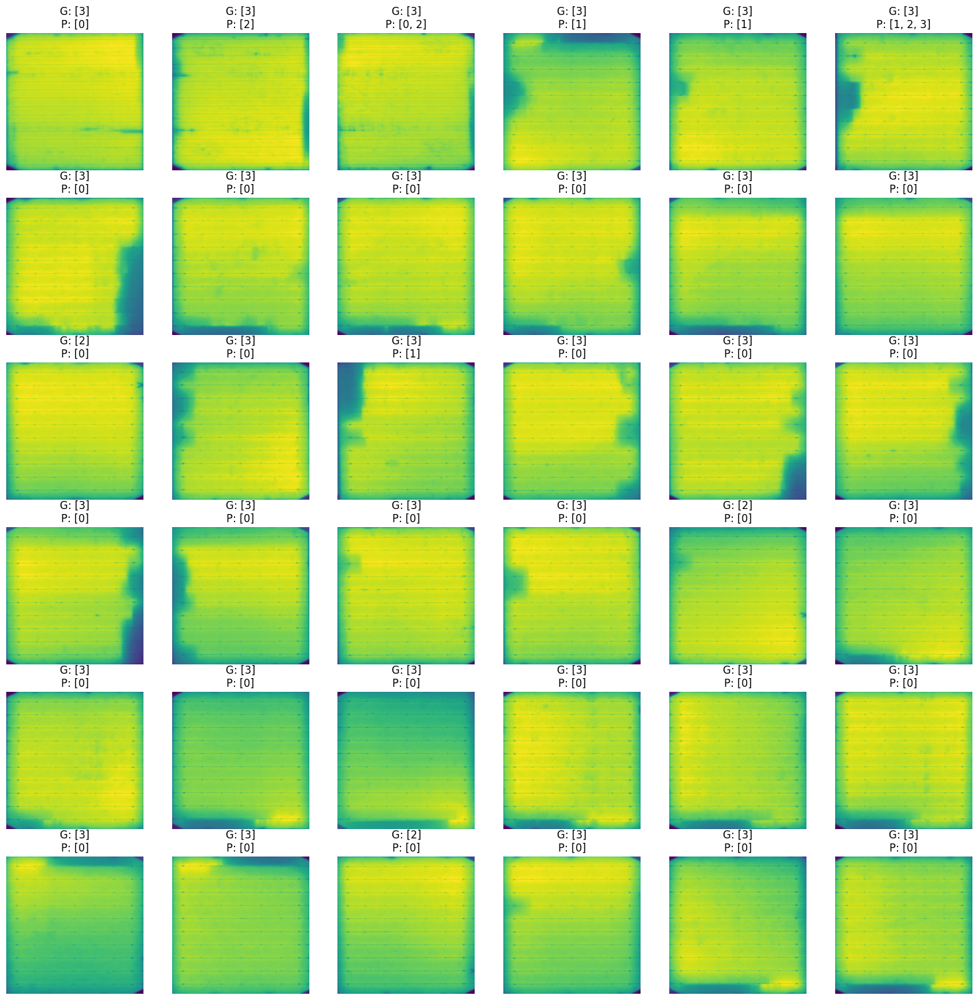

In [88]:
# plot wrong samples (handles multi-labels and uses ds_test_inf which has 'pixel_values'+'labels')
# Build true label array and a binary prediction array so shapes match before comparison.
true = np.array([item['labels'] for item in dataset_Website])  # shape (N, num_labels)

# Build binary prediction matrix (N, num_labels) from predlabels (supports list-of-lists, numpy array of ints, or array-of-arrays)
if isinstance(predlabels, np.ndarray) and predlabels.ndim == 1 and predlabels.shape[0] == true.shape[0]:
    # single-label integer predictions
    pred_bin = np.zeros_like(true, dtype=int)
    pred_bin[np.arange(len(predlabels)), predlabels] = 1
else:
    pred_bin = np.zeros_like(true, dtype=int)
    for i, p in enumerate(predlabels):
        if p is None:
            continue
        if np.isscalar(p):
            pred_bin[i, int(p)] = 1
        else:
            for cls in p:
                pred_bin[i, int(cls)] = 1

# mismatch indices where any label differs
mismatch_idx = np.where(np.any(true != pred_bin, axis=1))[0]

if mismatch_idx.size == 0:
    print("No mismatches found.")
else:
    fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
    cnt = 0
    for i in range(6):
        for j in range(6):
            if cnt >= len(mismatch_idx):
                ax[i, j].axis('off')
                continue
            idx0 = int(mismatch_idx[cnt])
            s = dataset_Website[idx0]
            pv = s['images']
            # convert tensor-like to numpy if needed and transpose for imshow
            try:
                if hasattr(pv, "numpy"):
                    pv = pv.numpy()
                img = np.transpose(pv, (1, 2, 0))
            except Exception:
                img = pv
            gt = np.where(true[idx0] > 0)[0].tolist()
            pred = predlabels[idx0]
            ax[i, j].imshow(img)
            ax[i, j].set_title(f"G: {gt}\nP: {pred}")
            ax[i, j].axis('off')
            cnt += 1
    plt.show()

# Duramat mono 3 (unlabeled)

In [ ]:
path_all = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_no_pool.pkl"
path_all_max = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_maxpool.pkl"
df_all = pd.read_pickle(path_all)
df_all_max = pd.read_pickle(path_all_max)
df_mono_3 = df_all.loc[df_all_max["technology"]=="mono_3"]
df_mono_3 = batch_transform(df_mono_3)
ds_mono_3 = Dataset.from_dict({
                "image": df_mono_3.pixel_values,
                "labels": np.zeros(df_mono_3.pixel_values.shape[0])
            })
ds_mono_3

Dataset({
    features: ['image', 'labels'],
    num_rows: 807
})

In [ ]:
predictions = trainer.predict(ds_mono_3)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

{'test_loss': 0.2632761299610138,
 'test_accuracy': 0.9392812887236679,
 'test_f1': 0.9686900958466453,
 'test_runtime': 45.4231,
 'test_samples_per_second': 17.766,
 'test_steps_per_second': 1.123}

In [ ]:
np.sum(predlabels != 0)

49

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

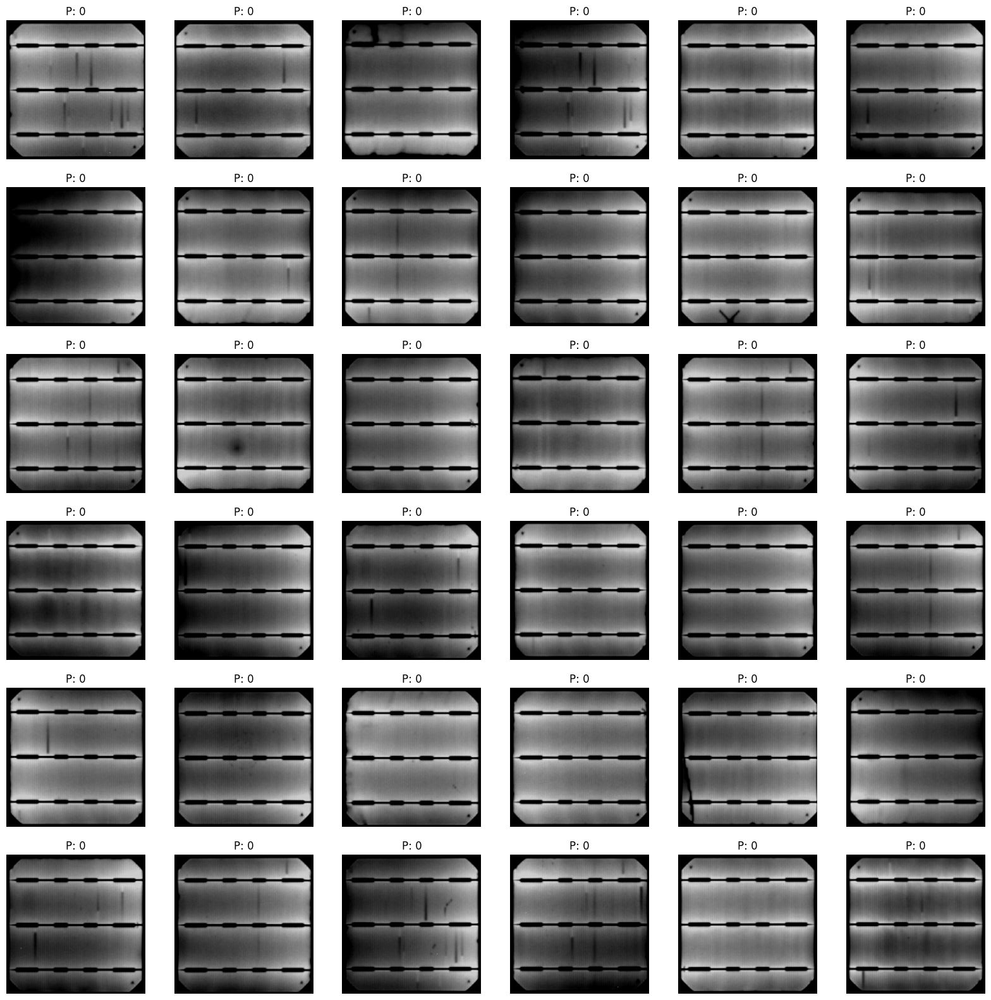

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['image'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

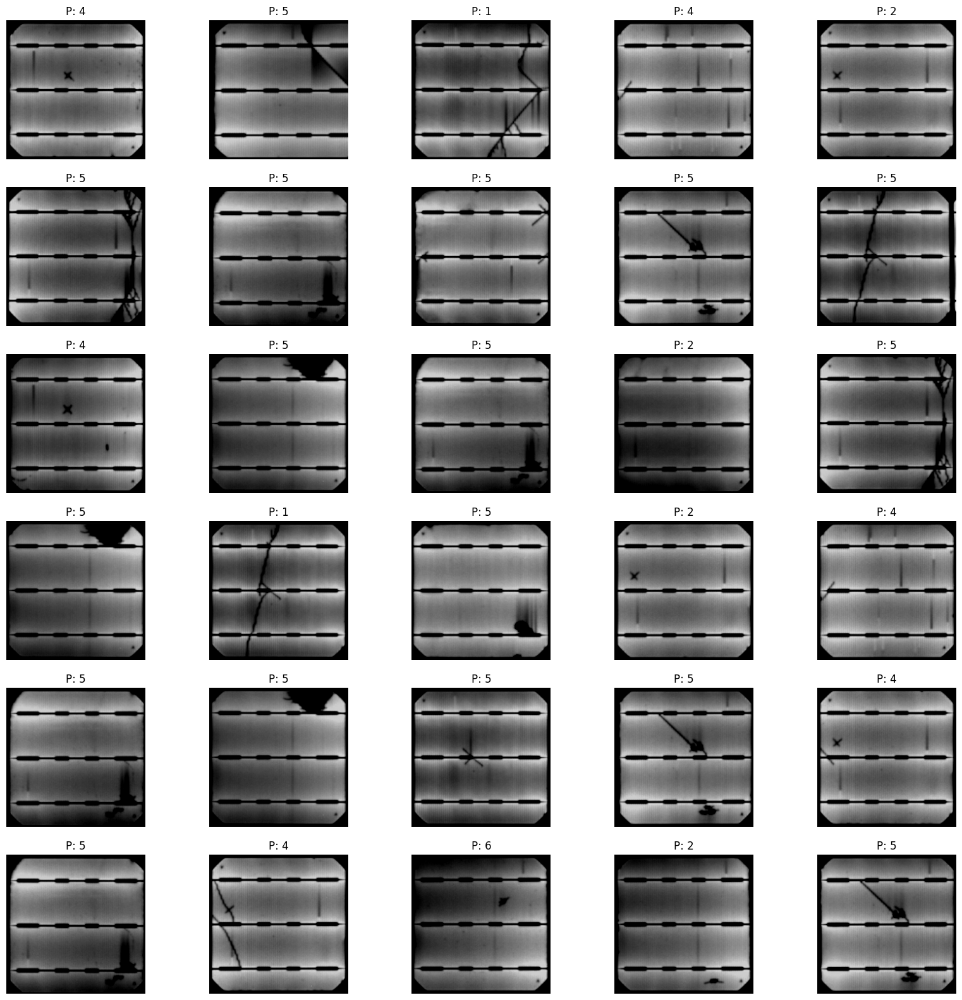

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['image'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

# Duramat Mono4 (unlabeled)

In [ ]:
import tensorflow as tf

In [ ]:
def extract_original_images(tf_dataset : tf.data.Dataset) -> np.ndarray:
    '''
    Function for the unsupervised case.
    Extracts the original images from a tf Dataset and saves them into a numpy array for further processing (e.g. with UMAP)
    This function assumes that offset = 0 and crop_size = image_size if cropped == none
    This function assumes it is working with images and not features extracted from images.
    '''
    images = []
    for batch_images in tf_dataset:
            for im in batch_images:
                images.append(np.array(im).astype(int))
 
    return images
 
directory = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/duramat_mono4_big"
data_ds_mono4 = tf.keras.utils.image_dataset_from_directory(
            directory=directory,
            labels=None,
            batch_size=128,
            #image_size=image_size,
            seed=42,
            #subset= subset,
            #validation_split=validation_split,
            shuffle = False)
 
original_images = extract_original_images(data_ds_mono4)
 
df_mono_4 = pd.DataFrame(data = {"images" : original_images, "labels": np.zeros(len(original_images))})

df_mono_4 = batch_transform(df_mono_4)
ds_mono_4 = Dataset.from_dict({
                "image": df_mono_4.pixel_values,
                "labels": np.zeros(df_mono_4.pixel_values.shape[0])
            })
ds_mono_4


Found 10620 files.


2024-11-28 16:10:48.366306: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Ultra
2024-11-28 16:10:48.366341: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 128.00 GB
2024-11-28 16:10:48.366346: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 48.00 GB
2024-11-28 16:10:48.366545: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-11-28 16:10:48.366566: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2024-11-28 16:11:02.346751: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Dataset({
    features: ['image', 'labels'],
    num_rows: 10620
})

In [ ]:
predictions = trainer.predict(ds_mono_4)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

{'test_loss': 0.41850829124450684,
 'test_accuracy': 0.901412429378531,
 'test_f1': 0.9481503491308869,
 'test_runtime': 578.0253,
 'test_samples_per_second': 18.373,
 'test_steps_per_second': 1.149}

In [ ]:
np.sum(predlabels != 0)

1047

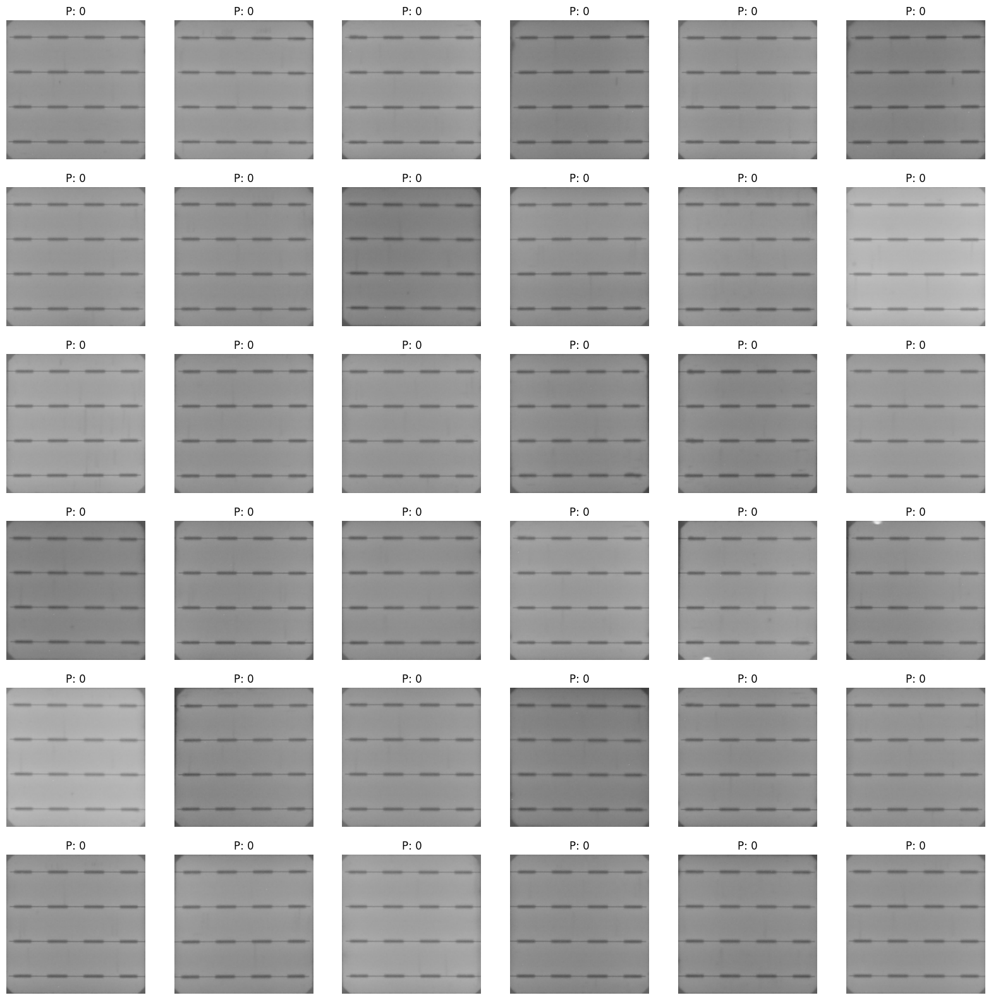

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

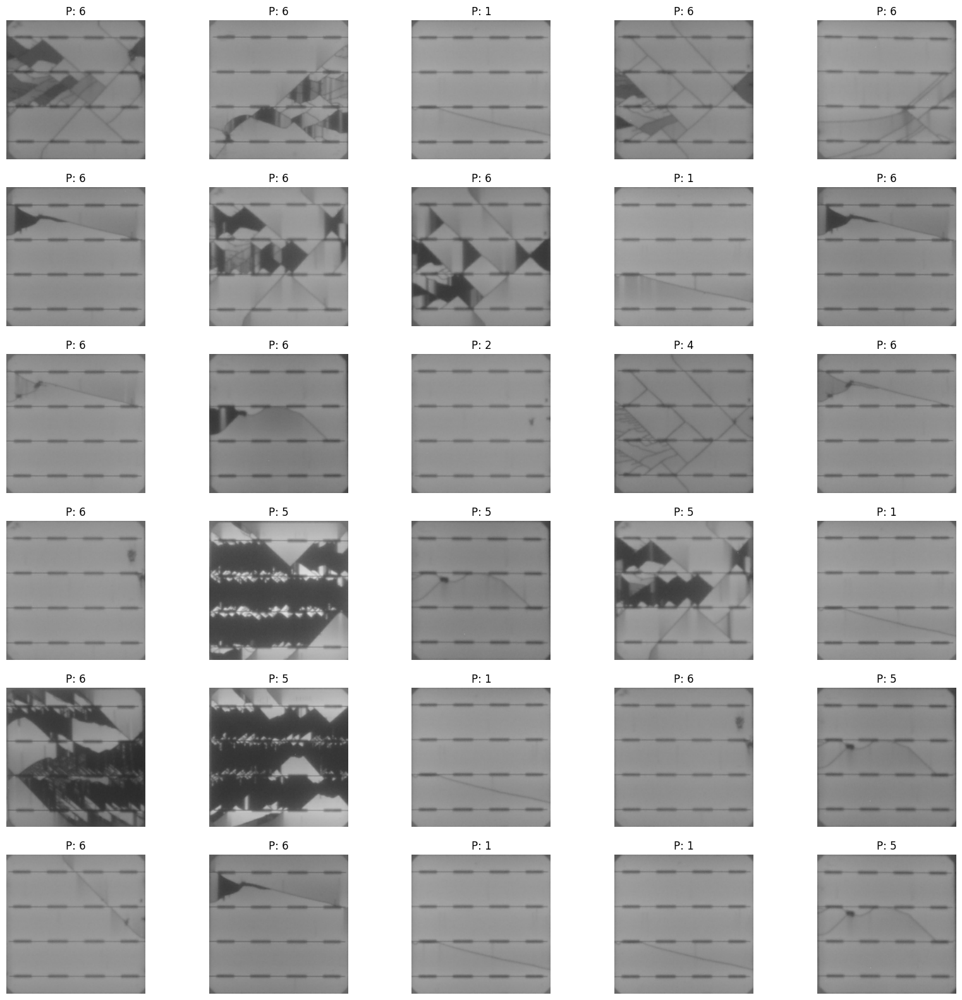

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

# TISO (unlabeled)

In [ ]:
import os
directory = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/TISO-EAGLE-23-P09_images"
def decode_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_tiff(img, channels=3)  # Adjust channels as necessary
    img = tf.image.resize(img, [256, 256])  # Resize to desired dimensions
    return img

# Function to process the dataset
def process_path(file_path):
    label = tf.strings.split(file_path, os.path.sep)[-2]
    img = decode_img(file_path)
    return img, label

def LoadTiffDS(directory):
# Create dataset from directory
    data_ds = tf.data.Dataset.list_files(os.path.join(directory, '*/*.tif'))
    data_ds = data_ds.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Shuffle and batch the dataset
    data_ds = data_ds.shuffle(buffer_size=1000)
    data_ds = data_ds.batch(batch_size=128)
    data_ds = data_ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return data_ds

data_ds_tiso = LoadTiffDS(directory)
 
original_images = extract_original_images(data_ds_tiso)
 
df_tiso = pd.DataFrame(data = {"pixel_value" : original_images, "labels": np.zeros(len(original_images))})

df_tiso = batch_transform(df_tiso)
ds_tiso = Dataset.from_dict({
                "image": df_tiso.pixel_values,
                "labels": np.zeros(df_tiso.pixel_values.shape[0])
            })
ds_tiso

In [ ]:
predictions = trainer.predict(ds_tiso)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

In [ ]:
np.sum(predlabels == 0)

In [ ]:
np.sum(predlabels != 0)

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_tiso.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_tiso.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

In [5]:
# load later:
import os
import torch
save_path = os.path.join('predictions', f'predictions_with_PVVintage.pt')

loaded = torch.load(save_path)


/var/folders/s4/l6k_zf9573j5vh_2y0qy50sc0000gx/T/ipykernel_99069/207608909.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loaded = torch.load(save_path)


In [31]:
# ...existing code...
import numpy as np
import torch
from collections.abc import Mapping
from collections import Counter

def flatten_to_2d(x):
    """Recursively flatten nested lists/tuples/tensors into a single (N, C) numpy array."""
    leaves = []

    def _to_np(a):
        if isinstance(a, torch.Tensor):
            a = a.detach().cpu().numpy()
        return np.asarray(a)

    def _walk(a):
        if isinstance(a, (list, tuple)):
            for b in a:
                _walk(b)
        else:
            leaves.append(_to_np(a))

    _walk(x)

    mats = []
    for arr in leaves:
        if arr.ndim == 0:
            # skip scalars
            continue
        if arr.ndim == 1:
            mats.append(arr.reshape(1, -1))
        else:
            mats.append(arr.reshape(-1, arr.shape[-1]))

    if not mats:
        return np.empty((0, 0))

    # keep only arrays with the most common last-dimension
    last_dims = [m.shape[-1] for m in mats]
    common_C, _ = Counter(last_dims).most_common(1)[0]
    mats = [m for m in mats if m.shape[-1] == common_C]

    return np.concatenate(mats, axis=0)

# Normalize to list of chunks
chunks = [loaded] if isinstance(loaded, Mapping) else list(loaded)

folders = []
pred_list = []
label_list = []

for d in chunks:
    if 'folder' in d:
        f = d['folder']
        if isinstance(f, (list, tuple)):
            folders.extend(list(f))
        elif f is not None:
            folders.append(f)
    if 'predictions' in d:
        pred_list.append(flatten_to_2d(d['predictions']))
    if 'label_ids' in d:
        label_list.append(flatten_to_2d(d['label_ids']))

combined = {
    'folder': folders,
    'predictions': np.concatenate(pred_list, axis=0) if pred_list else np.empty((0, 0)),
    'label_ids': np.concatenate(label_list, axis=0) if label_list else np.empty((0, 0)),
}

print('predictions shape:', combined['predictions'].shape)
print('label_ids shape  :', combined['label_ids'].shape)
print('folders          :', len(combined['folder']))

# class indices if single-label
if combined['predictions'].ndim == 2 and combined['predictions'].shape[0] > 0:
    predlabels = combined['predictions'].argmax(axis=-1)
else:
    predlabels = np.array([])

combined['predictions']



predictions shape: (676, 7)
label_ids shape  : (676, 7)
folders          : 23


array([[ -1.9510815 ,   0.46101865,  -5.1655126 , ...,  -7.999909  ,
        -10.57216   ,  -5.2136445 ],
       [ -3.8399496 ,   0.12941864,  -4.653058  , ...,  -5.8203125 ,
         -6.260506  ,  -5.123814  ],
       [ -2.762834  ,   0.21507469,  -4.4097524 , ...,  -7.417537  ,
         -7.5166707 ,  -6.298629  ],
       ...,
       [ -0.07676382,  -0.36261198,  -8.687602  , ...,  -8.85316   ,
         -1.3059824 ,  -7.6442547 ],
       [ -0.82571167,   0.02899971,  -8.521636  , ...,  -8.467233  ,
         -1.5785758 ,  -4.7251606 ],
       [  0.46664327,  -2.2561638 ,  -7.042297  , ...,  -9.833745  ,
         -2.4925456 ,  -6.8661184 ]], dtype=float32)

In [33]:
import numpy as np
label_names  =  {  0: 'good',
            1: 'crack',
            2: 'cross',
            3: 'dark',
            4: 'corrosion',
            5: 'discoloration',
            6: 'delamination',
        }
num_labels=7
# Evaluation cell - uses existing variables: predictions, num_labels, label_names (dict)
from sklearn.metrics import (f1_score, precision_score, recall_score,
                             precision_recall_fscore_support, hamming_loss,
                             multilabel_confusion_matrix, accuracy_score, roc_auc_score)

# prepare predictions and ground truth
logits = combined['predictions']
if isinstance(logits, (tuple, list)):
    logits = logits[0]
probs = 1.0 / (1.0 + np.exp(-logits))
preds = (probs > 0.5).astype(int)
true = combined['label_ids'].astype(int)

# overall multi-label metrics
metrics = {
    "f1_micro": f1_score(true, preds, average="micro"),
    "f1_macro": f1_score(true, preds, average="macro"),
    "precision_micro": precision_score(true, preds, average="micro", zero_division=0),
    "recall_micro": recall_score(true, preds, average="micro", zero_division=0),
    "hamming_loss": hamming_loss(true, preds),
    "subset_accuracy": float(np.mean(np.all(true == preds, axis=1))),
}
print("Overall metrics:")
for k, v in metrics.items():
    print(f"  {k}: {v:.4f}")

# per-class precision/recall/f1/support
prec, rec, f1, sup = precision_recall_fscore_support(true, preds, average=None, zero_division=0)
print("\nPer-class metrics:")
for i in range(num_labels):
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  precision={prec[i]:.3f}  recall={rec[i]:.3f}  f1={f1[i]:.3f}  support={int(sup[i])}")

# per-class confusion components (TN, FP, FN, TP)
mlcm = multilabel_confusion_matrix(true, preds)
print("\nPer-class confusion (TN, FP, FN, TP):")
for i, cm in enumerate(mlcm):
    tn, fp, fn, tp = cm.ravel()
    name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
    print(f"  [{i}] {name:12s}  TN={tn:5d}  FP={fp:5d}  FN={fn:5d}  TP={tp:5d}")

# top-1 accuracy on examples that are single-label in ground truth
single_mask = (true.sum(axis=1) == 1)
if single_mask.any():
    true_single = true[single_mask].argmax(axis=1)
    pred_single = preds[single_mask].argmax(axis=1)
    top1_acc = accuracy_score(true_single, pred_single)
    print(f"\nTop-1 accuracy on single-label examples: {top1_acc:.4f}  (n={int(single_mask.sum())})")
else:
    print("\nNo single-label examples found for top-1 accuracy.")

# try ROC-AUC per class if applicable
try:
    aucs = []
    for i in range(num_labels):
        # require both positive and negative labels for AUC
        if len(np.unique(true[:, i])) > 1:
            aucs.append(roc_auc_score(true[:, i], probs[:, i]))
        else:
            aucs.append(np.nan)
    print("\nPer-class ROC AUC:")
    for i, a in enumerate(aucs):
        name = label_names.get(i, str(i)) if isinstance(label_names, dict) else str(i)
        print(f"  [{i}] {name:12s}  AUC={a if np.isnan(a) else f'{a:.4f}'}")
except Exception as e:
    print("\nROC AUC skipped due to error:", e)



Overall metrics:
  f1_micro: 0.0660
  f1_macro: 0.0513
  precision_micro: 0.1195
  recall_micro: 0.0456
  hamming_loss: 0.2749
  subset_accuracy: 0.0577

Per-class metrics:
  [0] good          precision=0.074  recall=0.146  f1=0.098  support=123
  [1] crack         precision=0.222  recall=0.061  f1=0.095  support=99
  [2] cross         precision=0.000  recall=0.000  f1=0.000  support=41
  [3] dark          precision=0.317  recall=0.090  f1=0.140  support=223
  [4] corrosion     precision=0.095  recall=0.015  f1=0.026  support=132
  [5] discoloration  precision=0.000  recall=0.000  f1=0.000  support=180
  [6] delamination  precision=0.000  recall=0.000  f1=0.000  support=210

Per-class confusion (TN, FP, FN, TP):
  [0] good          TN=  327  FP=  226  FN=  105  TP=   18
  [1] crack         TN=  556  FP=   21  FN=   93  TP=    6
  [2] cross         TN=  635  FP=    0  FN=   41  TP=    0
  [3] dark          TN=  410  FP=   43  FN=  203  TP=   20
  [4] corrosion     TN=  525  FP=   19  FN